## Algoritmo K-means

K-means es un algoritmo de agrupamiento que se utiliza para dividir un conjunto de datos en \( k \) grupos (clusters) basados en características similares.

### Objetivo
Agrupar datos en \( k \) clusters, donde cada dato pertenece al cluster con la media más cercana, es decir, agrupar las observaciones por sus simulitudes, provocando que quienes tengas pocas disimilitudes queden en el mismo cluster, minimizando la varianza entre cluster
`tu vencindad te define`

### Conceptos Claves:
- **Observaciones**: Cada individuo del DF debe estar contenido en algún cluster y no pertecene a más de un cluster
- **Centroides**: Puntos que representan el centro de cada cluster.
- **Distancia Euclidiana**: Métrica comúnmente utilizada para medir la distancia entre puntos en el espacio.
        $$
        d(x, y) = \sqrt{\sum_{i=1}^{n} (x_i - y_i)^2}
        $$
- **Disperción interna**: es la varianza dentro de cada cluster
- **Cluster**: grupo de observaciones que poseen similitudes que permiten agruparlos
- **Inercia**: Suma de las distancias cuadradas de cada punto a su centroide más cercano. Se utiliza para evaluar la calidad del agrupamiento.

### Variables requeridas
Se requieren variables cuantitativas y estandarizadas para calcular distancias de manera efectiva.

### Algoritmo
1. **Inicialización de centroides**: Seleccionar \( k \) puntos aleatorios como centroides iniciales.
2. **Asignación de clusters**: Asignar cada punto de datos al centroide más cercano.
3. **Actualización de centroides**: Calcular la nueva posición de cada centroide como la media de los puntos asignados a ese cluster.
4. **Repetición**: Repetir los pasos 2 y 3 hasta que los centroides no cambien significativamente o se alcance un número máximo de iteraciones.
5. **Seleccionar número de clusters**: podemos usar la el screeplot igual que en componentes, pero, en este caso se grafica la varianza intragrupo. Al igual que en PCA la determinación de \( k \) cluster dependerá de la selección del investigador utilizando graficas que apoyen su selección.

### Evaluación
- Un buen agrupamiento es uno en que la variación dentro del cluster sea lo más pequeña posible
- **Inercia**: Evaluar la suma de las distancias cuadradas de los puntos a sus centroides. Menor inercia indica mejor agrupamiento.
- Como utiliza distancias es sensible a las unidades de medidas y outliers

### Selección del número de clusters
- **Método del codo**: Graficar la inercia en función del número de clusters y buscar el "codo" en la gráfica, donde la inercia deja de disminuir significativamente.

In [11]:
# Importar librerias 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn.cluster as cluster
from sklearn.preprocessing import StandardScaler
%matplotlib inline  
# magic command de Jupyter Notebook que permite que las visualizaciones de matplotlib se muestren directamente en el notebook

In [12]:
# Carga de datos
from sklearn.datasets import load_breast_cancer

In [13]:
# Exploración del dataset
data = pd.DataFrame(load_breast_cancer().data,columns = load_breast_cancer().feature_names)
data.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [14]:
# Normalizo los datos
scaler = StandardScaler()
data_normalized = scaler.fit_transform(data)
data_normalized_df = pd.DataFrame(data_normalized, columns=data.columns)
data_normalized_df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100


**Ejecutaremos el algoritmo Kmeans sobre la totalidad del dataset y luego sobre dos variables en particular.**

c:\Users\csolis\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\csolis\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\csolis\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\csolis\AppData\Local\anaconda3\envs\myenv\Lib\sit

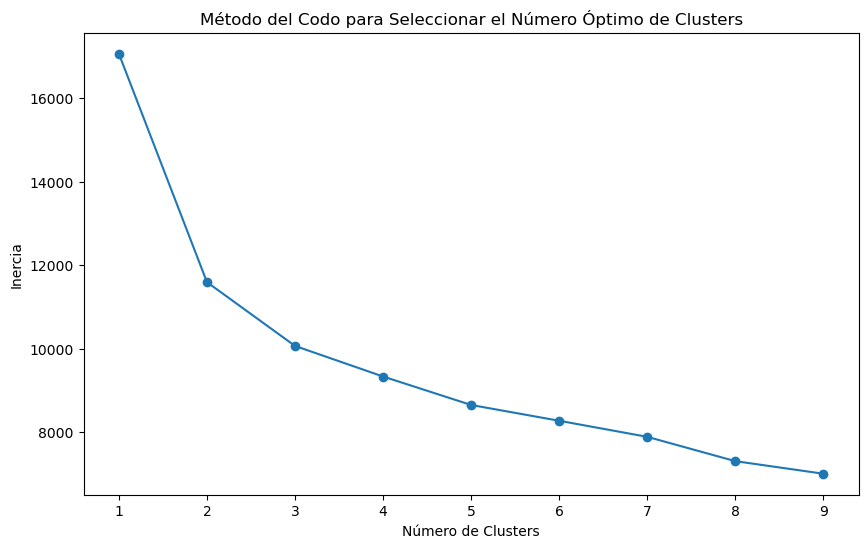

In [15]:
# Determinar cuantos cluster, buscando minimizar las distancias intergrupos
inertia = []
for n_clusters in range(1, 10):
    kmeans = cluster.KMeans(n_clusters=n_clusters, init="k-means++", max_iter=300)
    kmeans.fit(data_normalized_df)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel('Número de Clusters')
plt.ylabel('Inercia')
plt.title('Método del Codo para Seleccionar el Número Óptimo de Clusters')
plt.show()

In [16]:
%time # Magic commmand para medir el tiempo de ejecución del algoritmo
kmeans = cluster.KMeans(n_clusters=5 ,init="k-means++",max_iter=300) #creo el algoritmo con 5 clusters
kmeans = kmeans.fit(data_normalized_df)   #Ajusta el modelo K-means a las variables, puede ser más de dos variables[['mean area','mean smoothness']]

CPU times: total: 0 ns
Wall time: 0 ns


c:\Users\csolis\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [17]:
kmeans

KMeans(n_clusters=5)

In [18]:
data_normalized_df['Clusters'] = kmeans.labels_

In [19]:
sns.pairplot(data=data_normalized_df, hue='Clusters', corner=True)

<Axes: xlabel='mean area', ylabel='mean smoothness'>

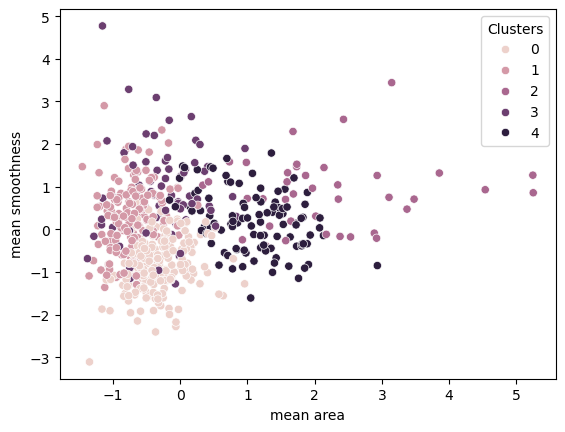

In [88]:
# Visualizo sobre dos variables de interes 
sns.scatterplot(x="mean area", y="mean smoothness",hue = 'Clusters',  data=data_normalized_df)

**Como el Kmeans esta efectuado sobre todo el DF**, no implica que el resultado sea "malo", solamente que no se identifican grupos claros al agrupar utilizando todas las variables y visualizando sobre "Mean Area"  y "Mean Smoothness"

**Para evidenciar la diferencia, repetiremos el ejercicio pero con KMeanss solo sobre estas dos variables**

c:\Users\csolis\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\csolis\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\csolis\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
c:\Users\csolis\AppData\Local\anaconda3\envs\myenv\Lib\sit

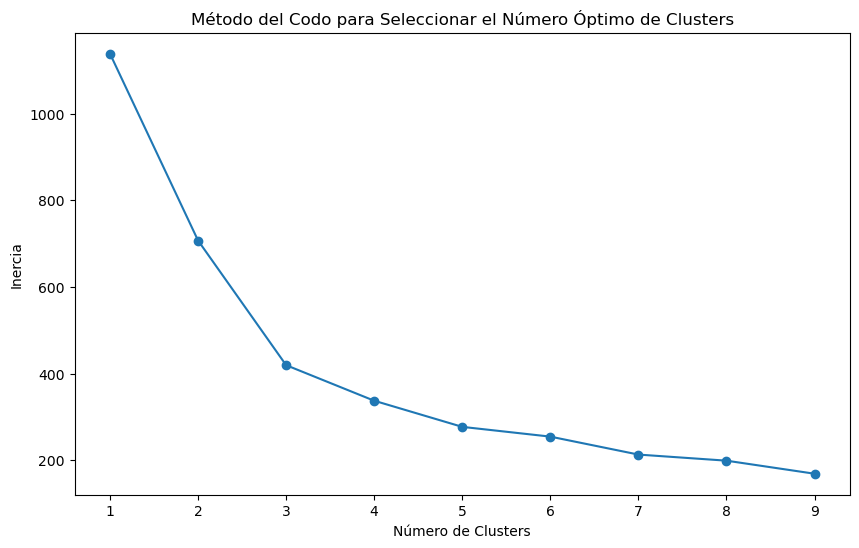

In [89]:
# Lista para almacenar la inercia para cada número de clusters
inertia = []

# Iterar sobre diferentes valores de n_clusters
for n_clusters in range(1, 10):
    kmeans = cluster.KMeans(n_clusters=n_clusters, init="k-means++", max_iter=300)
    kmeans.fit(data_normalized_df[['mean area', 'mean smoothness']])
    inertia.append(kmeans.inertia_)

# Graficar la inercia para cada número de clusters
plt.figure(figsize=(10, 6))
plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel('Número de Clusters')
plt.ylabel('Inercia')
plt.title('Método del Codo para Seleccionar el Número Óptimo de Clusters')
plt.show()

In [90]:
%time # Magic commmand para medir el tiempo de ejecución del algoritmo
kmeans = cluster.KMeans(n_clusters=5 ,init="k-means++",max_iter=300) #creo el algoritmo con 5 clusters
kmeans = kmeans.fit(data_normalized_df[['mean area', 'mean smoothness']])   #Ajusta el modelo K-means a las variables, puede ser más de dos variables[['mean area','mean smoothness']]

CPU times: total: 0 ns
Wall time: 0 ns


c:\Users\csolis\AppData\Local\anaconda3\envs\myenv\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [91]:
data_normalized_df['Clusters'] = kmeans.labels_

<Axes: xlabel='mean area', ylabel='mean smoothness'>

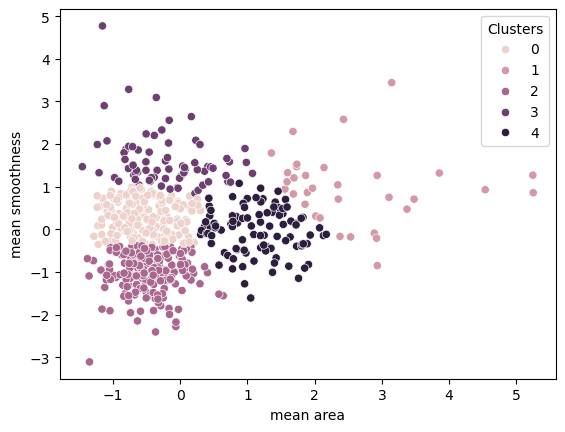

In [92]:
# Visualizo sobre dos variables de interes 
sns.scatterplot(x="mean area", y="mean smoothness",hue = 'Clusters',  data=data_normalized_df)

**Como el Kmeans fue efectuado unicamente sobre estas dos variables** al visualizar los clusters generados se logran identificar claramente los grupos generados 